In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3 as sql
import numpy as np
import warnings
import scipy.stats as stats

warnings.filterwarnings('ignore')

In [3]:
import importlib
import sys
import os
parent_dir = os.path.dirname(os.path.dirname(os.path.abspath('')))

print(parent_dir)
sys.path.insert(0,parent_dir)
import data_manipulation.data_transform as dat

importlib.reload(dat)

/home/cody/Documents/DataSciBC/EPLTransfer


<module 'data_manipulation.data_transform' from '/home/cody/Documents/DataSciBC/EPLTransfer/data_manipulation/data_transform.py'>

In [4]:
main_data_path = "../../data/main_data/train/train.csv"
train = pd.read_csv(main_data_path)
train

,name,dob,pos,height,foot,date,market_value,adjusted_market_value,team,league,...,red_card,rating,accuratePass,accurateLongBalls,accurateCross,accurateKeeperSweeper,expectedAssists,expectedGoals,xGChain,xGBuildup
0,noah mbamba,2005-01-04,D,187.0,right,2024-02-03,3000000.0,3000000,Bayer 04 Leverkusen,Bundesliga,...,0.0,5.414286,13.523810,0.619048,0.047619,0.000000,0.025627,0.001195,0.000000,0.000000
1,zachary duncan,2000-05-29,M,183.0,right,2021-11-07,300000.0,367916,AGF,Superligaen,...,0.0,6.545833,9.000000,0.458333,0.041667,0.000000,0.000000,0.000000,0.000000,0.000000
2,manuel neuer,1986-03-26,G,193.0,right,2024-10-19,4000000.0,4000000,FC Bayern München,Bundesliga,...,0.0,6.536864,27.122881,5.411017,0.000000,0.495763,0.001084,0.000969,0.271096,0.270107
3,mickel miller,1995-12-01,M,173.0,left,2024-04-12,250000.0,250000,Plymouth Argyle,Championship,...,0.0,6.551163,13.837209,0.697674,0.418605,0.000000,0.067950,0.015244,0.000000,0.000000
4,gaetano monachello,1994-03-02,F,185.0,left,2016-05-15,900000.0,1191864,Atalanta,Serie A,...,0.0,6.550000,5.700000,0.200000,0.100000,0.000000,0.000000,0.111925,0.161218,0.061587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9362,michael svoboda,1998-10-14,D,195.0,right,2024-10-20,1500000.0,1500000,Venezia,Serie A,...,1.0,6.626923,29.730769,2.653846,0.038462,0.000000,0.038870,0.042371,0.117319,0.117319
9363,kalifa coulibaly,1991-08-20,F,197.0,right,2022-05-21,1500000.0,1742433,Nantes,Ligue 1,...,1.0,6.494059,7.405941,0.099010,0.069307,0.000000,0.050634,0.219190,0.265225,0.053416
9364,nordin jackers,1997-09-04,G,185.0,right,2024-04-28,900000.0,900000,Club Brugge KV,"First Division A, Championship Round",...,0.0,7.168571,20.742857,10.514286,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000
9365,mads kikkenborg,1999-10-06,G,197.0,right,2023-12-03,800000.0,845068,Lyngby,Superligaen,...,0.0,6.944186,16.488372,7.023256,0.000000,0.488372,0.000000,0.000000,0.000000,0.000000


In [5]:
train.columns

Index(['name', 'dob', 'pos', 'height', 'foot', 'date', 'market_value',
       'adjusted_market_value', 'team', 'league', 'minutesPlayed',
       'totalLongBalls', 'keyPass', 'totalPass', 'totalCross', 'goalAssist',
       'savedShotsFromInsideTheBox', 'saves', 'totalKeeperSweeper',
       'goalsPrevented', 'touches', 'possessionLostCtrl', 'dispossessed',
       'aerialLost', 'aerialWon', 'duelLost', 'duelWon', 'challengeLost',
       'outfielderBlock', 'totalContest', 'interceptionWon', 'wonContest',
       'totalTackle', 'totalClearance', 'blockedScoringAttempt', 'hitWoodwork',
       'bigChanceCreated', 'bigChanceMissed', 'shotOffTarget',
       'onTargetScoringAttempt', 'goals', 'wasFouled', 'fouls', 'totalOffside',
       'yellow_card', 'red_card', 'rating', 'accuratePass',
       'accurateLongBalls', 'accurateCross', 'accurateKeeperSweeper',
       'expectedAssists', 'expectedGoals', 'xGChain', 'xGBuildup'],
      dtype='object')

In [6]:
train = dat.transformer(train,EDA=True).data

In [7]:
train

,name,dob,pos,height,foot,date,market_value,adjusted_market_value,team,league,...,rating,accuratePass,accurateLongBalls,accurateCross,accurateKeeperSweeper,expectedAssists,expectedGoals,xGChain,xGBuildup,age
0,noah mbamba,2005-01-04,D,187.0,right,2024-02-03,14.914123,14.914123,Bayer 04 Leverkusen,Bundesliga,...,5.414286,13.523810,0.619048,0.047619,0.000000,0.025627,0.001195,0.000000,0.000000,19.0
1,zachary duncan,2000-05-29,M,183.0,right,2021-11-07,12.611541,12.815613,AGF,Superligaen,...,6.545833,9.000000,0.458333,0.041667,0.000000,0.000000,0.000000,0.000000,0.000000,21.0
2,manuel neuer,1986-03-26,G,193.0,right,2024-10-19,15.201805,15.201805,FC Bayern München,Bundesliga,...,6.536864,27.122881,5.411017,0.000000,0.495763,0.001084,0.000969,0.271096,0.270107,38.0
3,mickel miller,1995-12-01,M,173.0,left,2024-04-12,12.429220,12.429220,Plymouth Argyle,Championship,...,6.551163,13.837209,0.697674,0.418605,0.000000,0.067950,0.015244,0.000000,0.000000,28.0
4,gaetano monachello,1994-03-02,F,185.0,left,2016-05-15,13.710151,13.991030,Atalanta,Serie A,...,6.550000,5.700000,0.200000,0.100000,0.000000,0.000000,0.111925,0.161218,0.061587,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9362,michael svoboda,1998-10-14,D,195.0,right,2024-10-20,14.220976,14.220976,Venezia,Serie A,...,6.626923,29.730769,2.653846,0.038462,0.000000,0.038870,0.042371,0.117319,0.117319,26.0
9363,kalifa coulibaly,1991-08-20,F,197.0,right,2022-05-21,14.220976,14.370794,Nantes,Ligue 1,...,6.494059,7.405941,0.099010,0.069307,0.000000,0.050634,0.219190,0.265225,0.053416,30.0
9364,nordin jackers,1997-09-04,G,185.0,right,2024-04-28,13.710151,13.710151,Club Brugge KV,"First Division A, Championship Round",...,7.168571,20.742857,10.514286,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,26.0
9365,mads kikkenborg,1999-10-06,G,197.0,right,2023-12-03,13.592368,13.647174,Lyngby,Superligaen,...,6.944186,16.488372,7.023256,0.000000,0.488372,0.000000,0.000000,0.000000,0.000000,24.0


# Target Exploration and Distribution

In [8]:
target = 'market_value'
adjusted_target = 'adjusted_market_value'

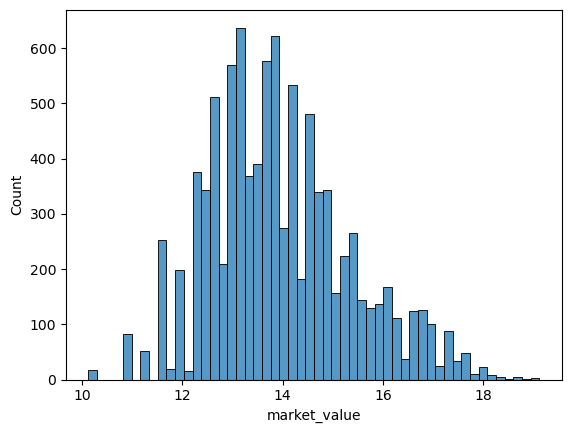

In [9]:
sns.histplot(train,x=target)
plt.show()

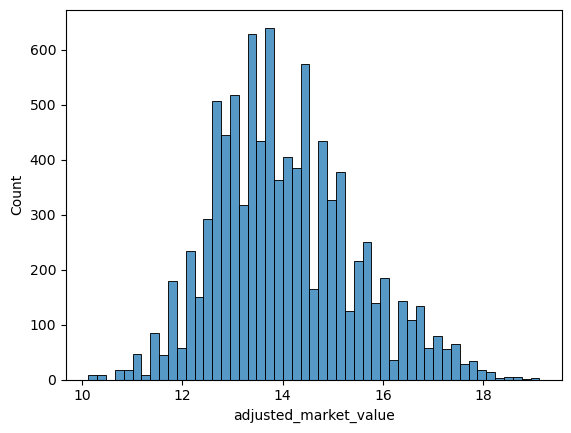

In [10]:
sns.histplot(train,x=adjusted_target)
plt.show()

In [11]:
# Skewness and Kurtosis
print(f'Skewness: {train[target].skew()}')
print(f'Kurtosis: {train[target].kurt()}')

Skewness: 0.47525075805335365
Kurtosis: 0.03665483966362393


In [12]:
print(f'Skewness: {train[adjusted_target].skew()}')
print(f'Kurtosis: {train[adjusted_target].kurt()}')

Skewness: 0.44862817693735024
Kurtosis: 0.04251651109737997


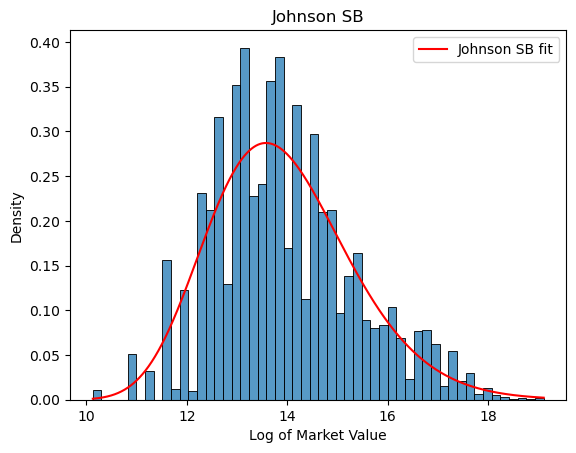

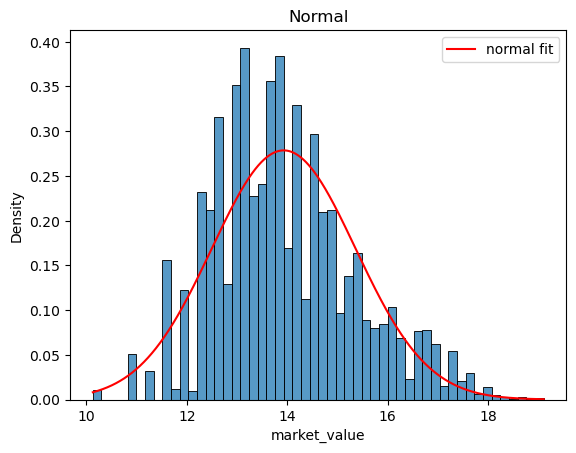

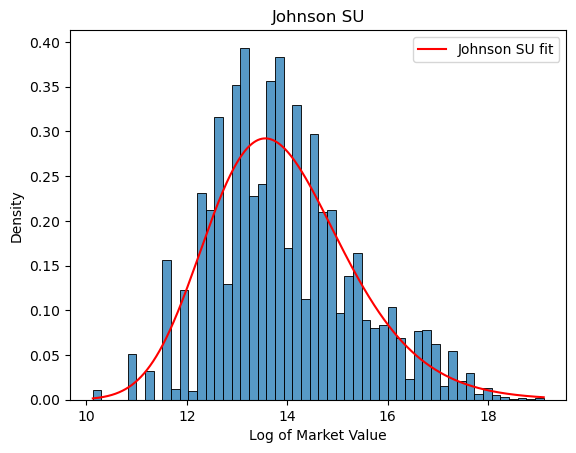

In [13]:
target_col = train[target]
x=np.linspace(min(target_col),max(target_col),100000)
plt.figure(1)
plt.title('Johnson SB')
plt.xlabel('Log of Market Value')
sns.histplot(data=train,x=target,stat='density')
john = stats.johnsonsb.fit(target_col)
plt.plot(x,stats.johnsonsb.pdf(x,*john),'r-',label='Johnson SB fit')
plt.legend()

plt.figure(2)
plt.title('Normal')
sns.histplot(data=train,x=target,stat='density')
mu,std = stats.norm.fit(target_col)
plt.plot(x,stats.norm.pdf(x,mu,std),'r-',label='normal fit')
plt.legend()

plt.figure(3)
plt.title('Johnson SU')
plt.xlabel('Log of Market Value')
sns.histplot(data=train,x=target,stat='density')
john = stats.johnsonsu.fit(target_col)
plt.plot(x,stats.johnsonsu.pdf(x,*john),'r-',label='Johnson SU fit')
plt.legend()
plt.show()

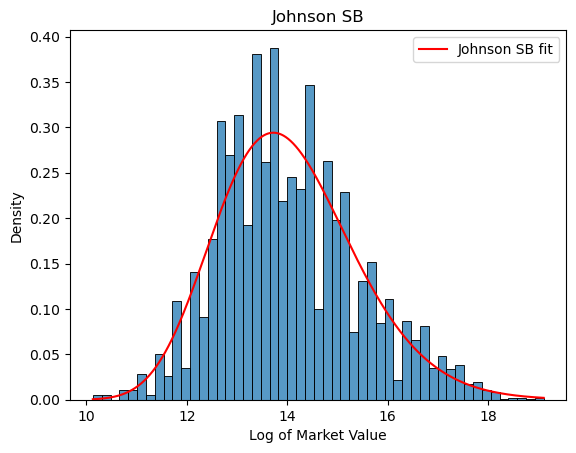

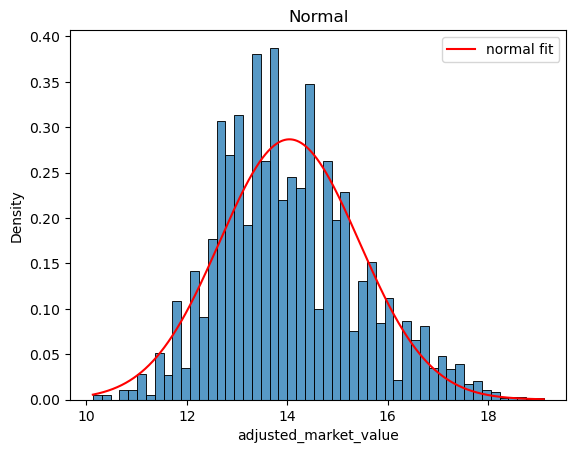

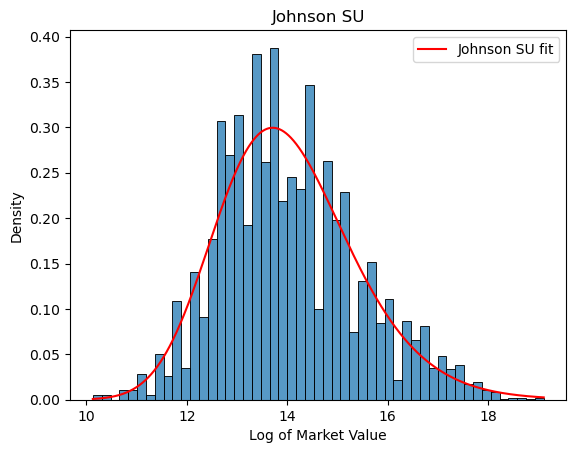

In [14]:
adjusted_target_col = train[adjusted_target]
x=np.linspace(min(target_col),max(target_col),100000)
plt.figure(1)
plt.title('Johnson SB')
plt.xlabel('Log of Market Value')
sns.histplot(data=train,x=adjusted_target,stat='density')
john = stats.johnsonsb.fit(adjusted_target_col)
plt.plot(x,stats.johnsonsb.pdf(x,*john),'r-',label='Johnson SB fit')
plt.legend()

plt.figure(2)
plt.title('Normal')
sns.histplot(data=train,x=adjusted_target,stat='density')
mu,std = stats.norm.fit(adjusted_target_col)
plt.plot(x,stats.norm.pdf(x,mu,std),'r-',label='normal fit')
plt.legend()

plt.figure(3)
plt.title('Johnson SU')
plt.xlabel('Log of Market Value')
sns.histplot(data=train,x=adjusted_target,stat='density')
john = stats.johnsonsu.fit(adjusted_target_col)
plt.plot(x,stats.johnsonsu.pdf(x,*john),'r-',label='Johnson SU fit')
plt.legend()
plt.show()

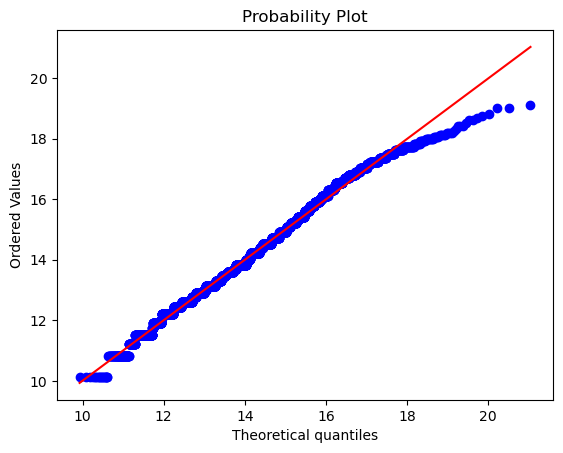

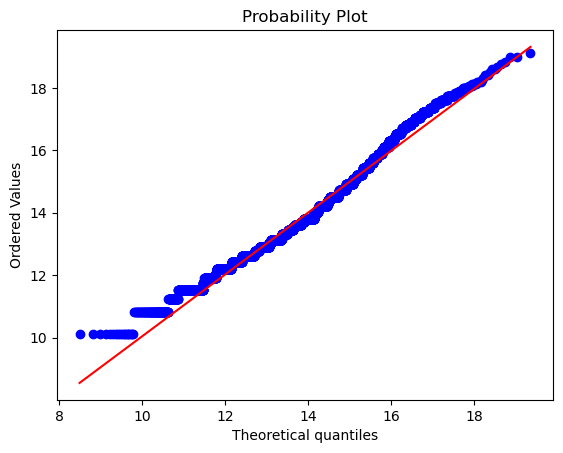

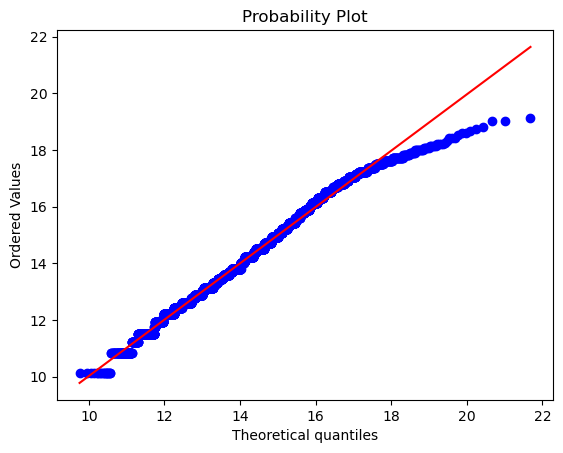

In [15]:
# QQ plot
plt.figure(1)
plt.title('Johnson SB')
john = stats.johnsonsb.fit(target_col)
stats.probplot(target_col,dist=stats.johnsonsb,sparams=john,plot=plt)

plt.figure(2)
plt.title('Normal')
norm_fit = stats.norm.fit(target_col)
stats.probplot(target_col,dist=stats.norm,sparams=norm_fit,plot=plt)

plt.figure(3)
plt.title('Johnson SU')
john = stats.johnsonsu.fit(target_col)
stats.probplot(target_col,dist=stats.johnsonsu,sparams=john,plot=plt)
plt.show()

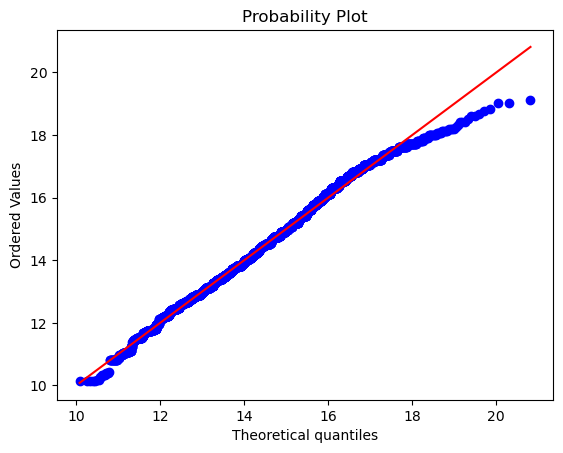

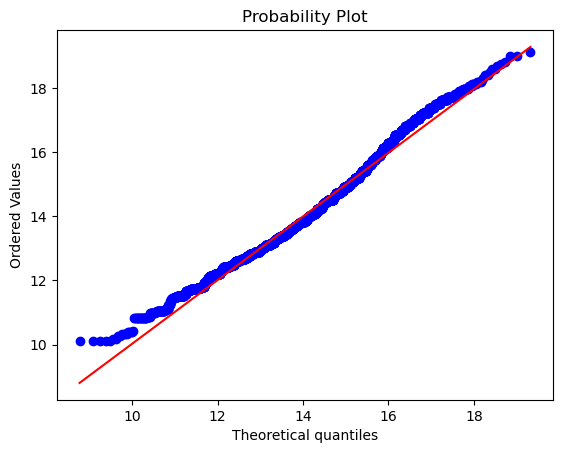

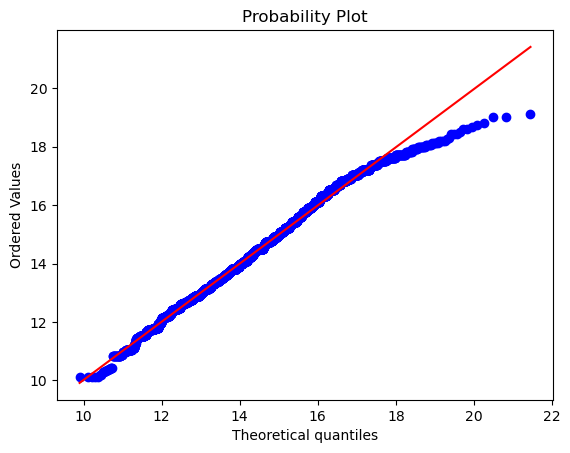

In [16]:
# QQ plot
plt.figure(1)
plt.title('Johnson SB')
john = stats.johnsonsb.fit(adjusted_target_col)
stats.probplot(adjusted_target_col,dist=stats.johnsonsb,sparams=john,plot=plt)

plt.figure(2)
plt.title('Normal')
norm_fit = stats.norm.fit(adjusted_target_col)
stats.probplot(adjusted_target_col,dist=stats.norm,sparams=norm_fit,plot=plt)

plt.figure(3)
plt.title('Johnson SU')
john = stats.johnsonsu.fit(adjusted_target_col)
stats.probplot(adjusted_target_col,dist=stats.johnsonsu,sparams=john,plot=plt)
plt.show()

When just taking the log of the target variables, we see that it is pretty close to normal or Johnson $S_B$ distribution, but it does have some skewness and kurtosis, which tells me that the Johnson $S_B$ distribution will probability be better.
One interesting thing is that dividing by 1million and then taking the log, gets us something that is very skewed.  

In [17]:
print(f"mean: {target_col.mean()}")
print(f"std: {target_col.std()}")
print(f"skewness: {target_col.skew()}")
print(f"Kurtosis: {target_col.kurt()}")
a,b,loc,scale = stats.johnsonsb.fit(target_col)
print(a,b,loc,scale)

mean: 13.930530721344125
std: 1.4321809409830062
skewness: 0.47525075805335365
Kurtosis: 0.03665483966362393
8.836149125267571 4.494986216986218 6.586896468698804 58.81937678140888


In [18]:
# Lets get quantiative columns:
def getNumericColumns(data):
    quantiative = [f for f in data.columns if data.dtypes[f] !='object']
    return quantiative
quant_f = getNumericColumns(train)
quant_f.remove('dob')
quant_f.remove('date')
quant_f


['height',
 'market_value',
 'adjusted_market_value',
 'minutesPlayed',
 'totalLongBalls',
 'keyPass',
 'totalPass',
 'totalCross',
 'goalAssist',
 'savedShotsFromInsideTheBox',
 'saves',
 'totalKeeperSweeper',
 'goalsPrevented',
 'touches',
 'possessionLostCtrl',
 'dispossessed',
 'aerialLost',
 'aerialWon',
 'duelLost',
 'duelWon',
 'challengeLost',
 'outfielderBlock',
 'totalContest',
 'interceptionWon',
 'wonContest',
 'totalTackle',
 'totalClearance',
 'blockedScoringAttempt',
 'hitWoodwork',
 'bigChanceCreated',
 'bigChanceMissed',
 'shotOffTarget',
 'onTargetScoringAttempt',
 'goals',
 'wasFouled',
 'fouls',
 'totalOffside',
 'yellow_card',
 'red_card',
 'rating',
 'accuratePass',
 'accurateLongBalls',
 'accurateCross',
 'accurateKeeperSweeper',
 'expectedAssists',
 'expectedGoals',
 'xGChain',
 'xGBuildup',
 'age']

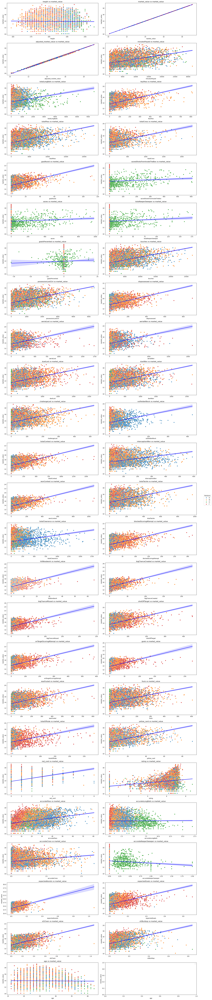

In [19]:
fig,axes = plt.subplots(ncols=2,nrows = int(len(quant_f)/2)+1,figsize=(20,100))
axes = axes.flatten()

for i, gs in enumerate(quant_f):
    
    sns.scatterplot(data=train,x=gs,y=target,hue='pos',ax=axes[i])
    sns.regplot(data=train,x=gs,y=target,scatter=False,ax=axes[i],color='blue')
    axes[i].set_title(f'{gs} vs market_value')
    axes[i].legend().remove()
    plt.xlabel(gs)
    plt.ylabel('market_value')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='Positions')
plt.tight_layout()
plt.legend()
plt.show()

In [1]:
fig,axes = plt.subplots(ncols=2,nrows = int(len(quant_f)/2)+1,figsize=(20,100))
axes = axes.flatten()

for i, gs in enumerate(quant_f):
    
    sns.scatterplot(data=train,x=gs,y=adjusted_target,hue='pos',ax=axes[i])
    sns.regplot(data=train,x=gs,y=adjusted_target,scatter=False,ax=axes[i],color='blue')
    axes[i].set_title(f'{gs} vs market_value')
    axes[i].legend().remove()
    plt.xlabel(gs)
    plt.ylabel('market_value')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='Positions')
plt.tight_layout()
plt.legend()
plt.show()

NameError: name 'plt' is not defined

In [ ]:
# Lets try to fit a curve for the age vs adjusted Market value:
age2 = np.pow(train['age'],2)
amv = train['adjusted_market_value']


In [30]:
# As we can see, certain stats are only important to goalkeepers, which we will need to extract our just for them.  

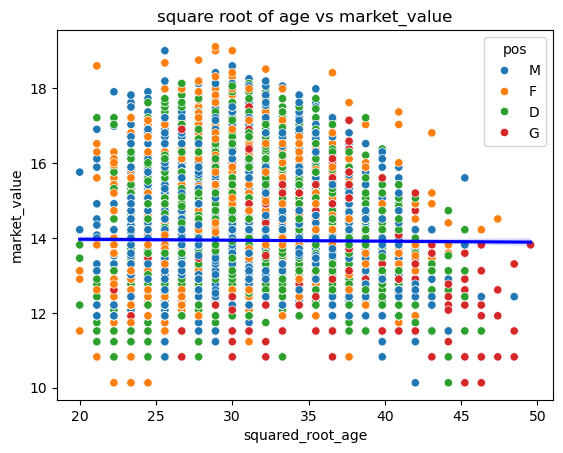

In [33]:
import numpy as np
# Lets look at age specifically as that is not linear, it look squadratic, so lets test what happens when we take the square root of it
train_sqrt = train.copy()
train_sqrt['squared_root_age'] = np.sqrt(train_sqrt['age']) + train_sqrt['age']
    
sns.scatterplot(data=train_sqrt,x='squared_root_age',y=target,hue='pos',)
sns.regplot(data=train_sqrt,x='squared_root_age',y=target,scatter=False,color='blue')
plt.title(f'square root of age vs market_value')

plt.ylabel('market_value')

plt.show()

In [31]:
#normality test
stat , p=stats.shapiro(train[quant_f])
print(f'Statistics = {stat}, p={p}')
alpha = 0.05
if p<alpha:
    print(f'Sample looks Gaussian (fail to reject H0)')
else:
    print(f'Sample does not look Gaussian (reject H0)')

Statistics = 0.17775612871886082, p=5.3638896502162233e-216
Sample looks Gaussian (fail to reject H0)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

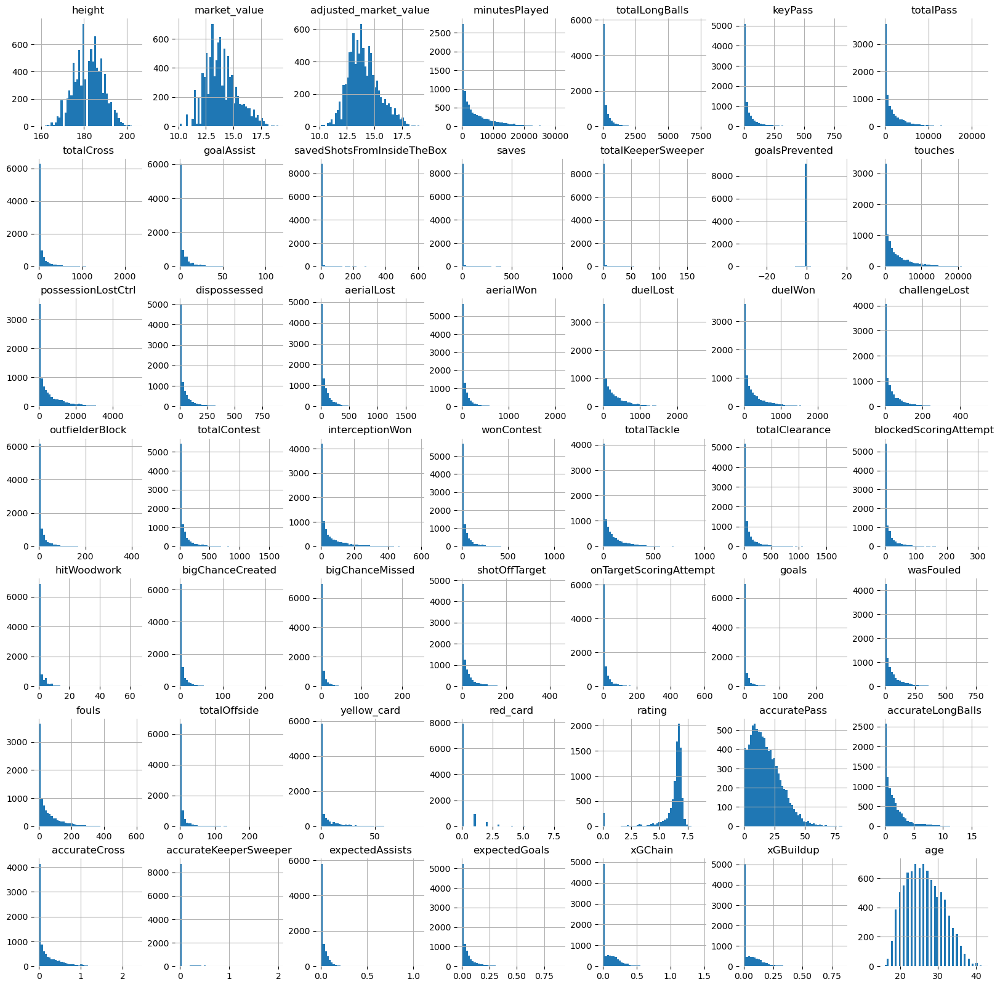

In [37]:
df = train[quant_f]
h = df.hist(bins=50,figsize=(20,20),xlabelsize='10',ylabelsize='10',xrot=-.15)
sns.despine(left=True,bottom=True)
[x.title.set_size(12) for x in h.ravel()]
[x.yaxis.tick_left() for x in h.ravel()]

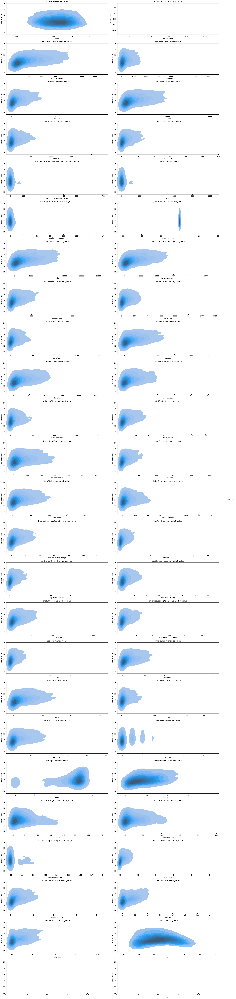

In [33]:
fig,axes = plt.subplots(ncols=2,nrows = int(len(quant_f)/2)+1,figsize=(20,90))
axes = axes.flatten()

for i, gs in enumerate(quant_f):
    
    sns.kdeplot(data=train,x=gs,y=target,fill=True,ax=axes[i])
    axes[i].set_title(f'{gs} vs market_value')
    axes[i].legend().remove()
    plt.xlabel(gs)
    plt.ylabel('market_value')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='Positions')
plt.tight_layout()
plt.legend()
plt.show()

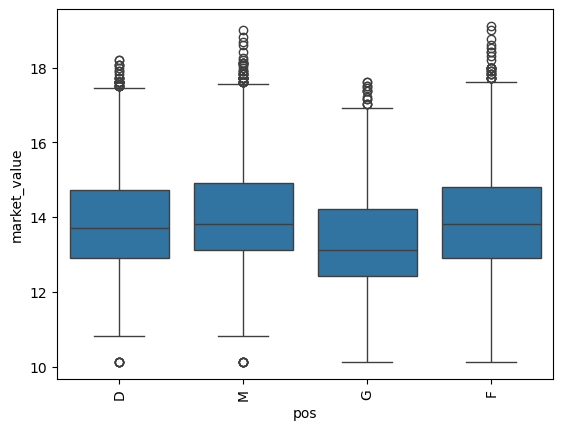

In [38]:

#df=scaled
plt.figure(1)

sns.boxplot(x=train['pos'],y=df[target])
plt.xticks(rotation=90)




plt.show()

<Axes: title={'center': 'Pearson Correlation Matrix'}>

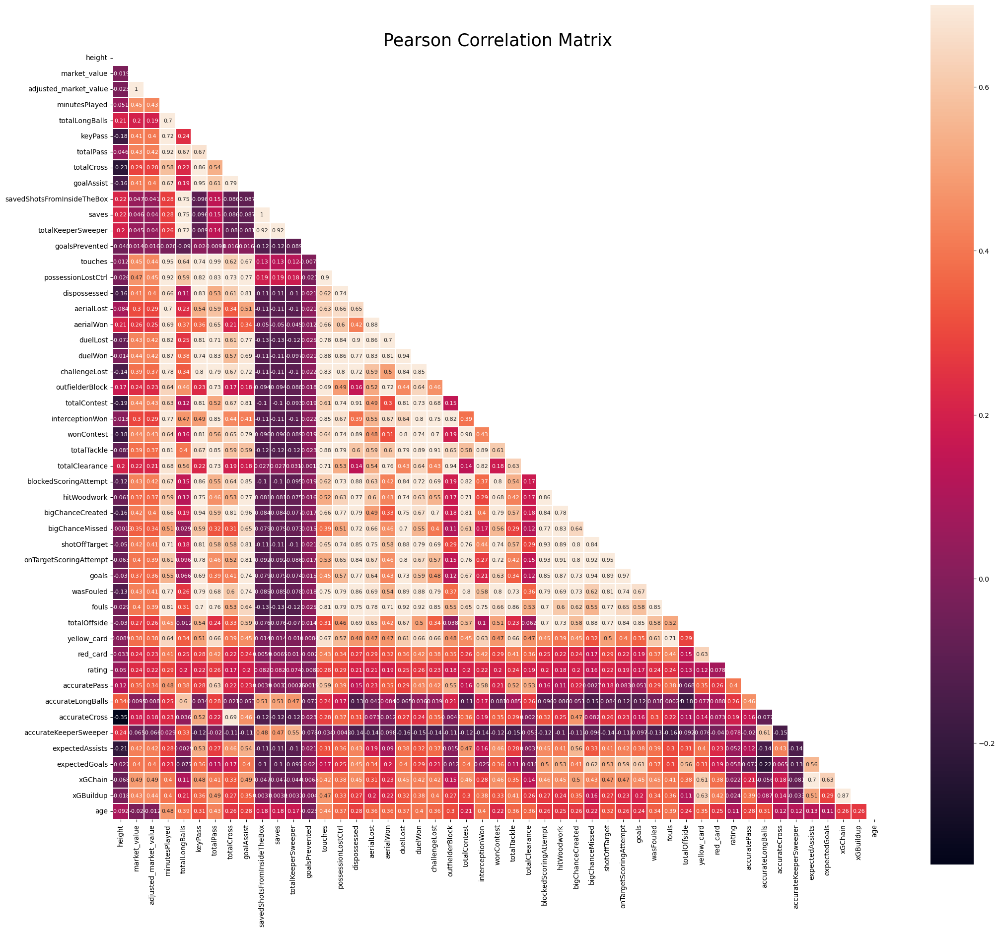

In [39]:
features = quant_f
mask = np.zeros_like(train[features].corr(),dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f,ax = plt.subplots(figsize=(25,25))
plt.title('Pearson Correlation Matrix',fontsize=25)

sns.heatmap(train[features].corr(),linewidths=0.25,vmax=0.7,square=True,linecolor='w',annot=True,annot_kws={'size':8},
            mask=mask,cbar_kws={'shrink':.9})